In [1]:
#!/usr/bin/env python3.5
# -*- coding: utf-8 -*-

import numpy as np
import scipy
from scipy.fftpack import fft, ifft
from scipy import signal
from scipy import hamming
import pandas as pd
import cmath
import math
import matplotlib
import matplotlib.pyplot as plt
matplotlib.use('Agg')
import seaborn as sns

%matplotlib inline

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\ProgramData\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\ProgramData\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\ProgramData\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\ProgramData\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 486, in start
    self.io_loop.start()
  File "C:\ProgramData\

In [64]:
data = pd.read_csv('C:/Users/Satake Kaho/Desktop/pre/data/68875.csv', names=('time','signal'))
signal_max= data.signal.max()
signal_min= data.signal.min()
N = 2**10
#262144個のデータ数を1024ずつに切る(これも変数にする)
data_div = [data.iloc[i*N:(i+1)*N, :] for i in range(0,int((2**18)/N))]

In [65]:
len(data_div)

256

# Full FFT

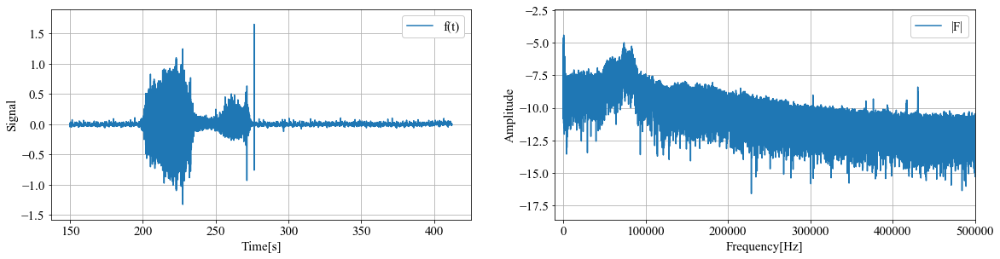

In [66]:
f, t = data.signal, data.time
full = 2**18
# 高速フーリエ変換
F = np.fft.fft(f)

# 振幅スペクトルを計算
Amp = np.abs(F)
Amp = Amp/full*2

#周波数軸
dt = 10.00**6  #サンプリング周波数
freq = np.linspace(0, dt, full)

# グラフ表示
plt.figure(figsize=(30,10))
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 15
plt.subplot(231)
plt.plot(t, f, label='f(t)')
plt.xlabel("Time[s]", fontsize=15)
plt.ylabel("Signal", fontsize=15)
plt.ylim(signal_min-0.25, signal_max+0.25)
plt.grid()
leg = plt.legend(loc=1, fontsize=15)
leg.get_frame().set_alpha(1)
plt.subplot(232)
plt.plot(freq, np.log(Amp), label='|F|')
plt.xlabel('Frequency[Hz]', fontsize=15)
plt.xlim(-10000, dt/2)
plt.ylabel('Amplitude', fontsize=15)
Amp = np.log(Amp)
Amp_min= Amp.min()
Amp_max= Amp.max()
plt.ylim(Amp_min-2, Amp_max+2)
plt.grid()
leg = plt.legend(loc=1, fontsize=15)
leg.get_frame().set_alpha(1)

plt.savefig('C:/Users/Satake Kaho/Desktop/pre/result/68875/fft後.png')                               

In [67]:
def test_fft(f, t):    
    # 高速フーリエ変換
    F = np.fft.fft(f)

    # 振幅スペクトルを計算
    Amp = np.abs(F)
    Amp = Amp/N *2 

    #周波数軸
    dt = 10.00**6  #サンプリング周波数
    freq = np.linspace(0, dt, N)

    # グラフ表示
    plt.figure(figsize=(30,10))
    plt.rcParams['font.family'] = 'Times New Roman'
    plt.rcParams['font.size'] = 15
    plt.subplot(231)
    plt.plot(t, f, label='f(t)')
    plt.xlabel("Time[s]", fontsize=15)
    plt.ylabel("Signal", fontsize=15)
    plt.ylim(signal_min-0.25, signal_max+0.25)
    plt.grid()
    leg = plt.legend(loc=1, fontsize=15)
    leg.get_frame().set_alpha(1)
    plt.subplot(232)
    plt.plot(freq, np.log(Amp), label='|F|')
    plt.xlabel('Frequency[Hz]', fontsize=15)
    plt.xlim(-10000, dt/2)
    plt.ylabel('Amplitude', fontsize=15)
    plt.ylim(Amp_min-2, Amp_max+7.5)
    plt.grid()
    leg = plt.legend(loc=1, fontsize=15)
    leg.get_frame().set_alpha(1)

    plt.savefig('C:/Users/Satake Kaho/Desktop/pre/result/68875/68875_{number}/fft後_{time}.png'. format(number=N,time=j+150))                          

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


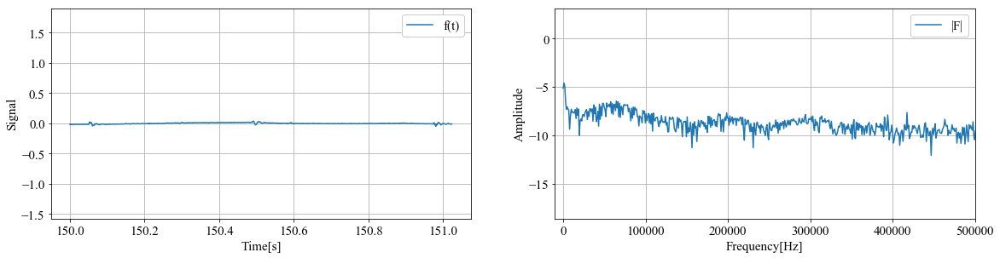

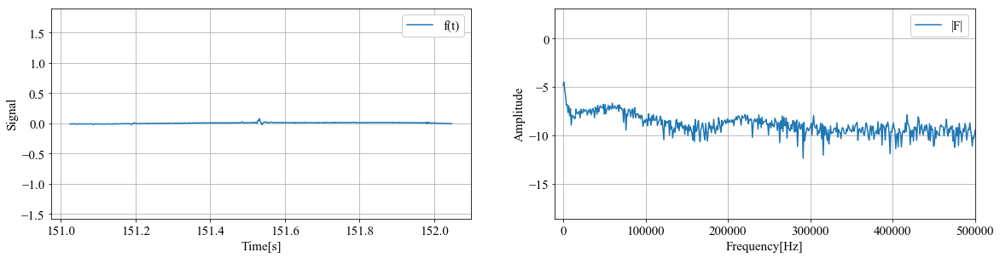

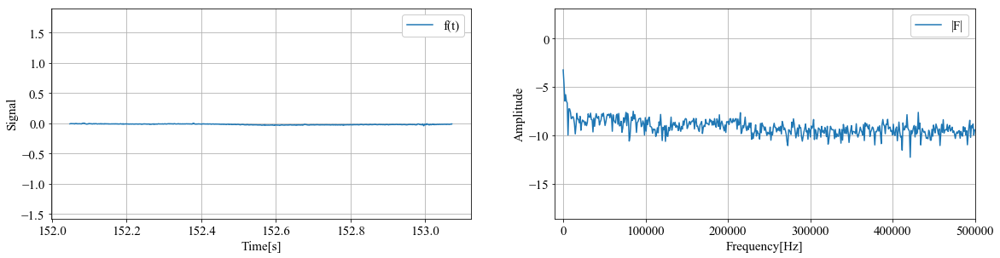

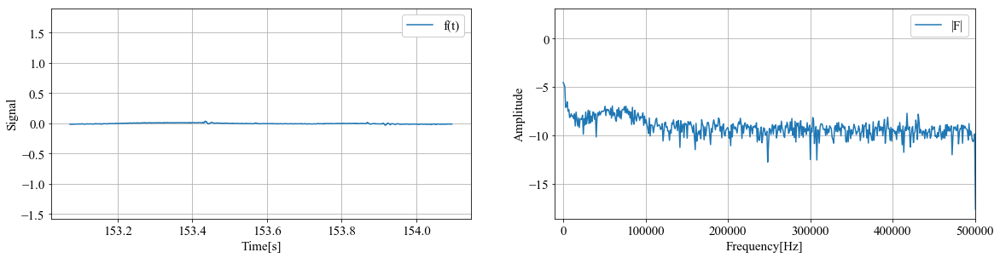

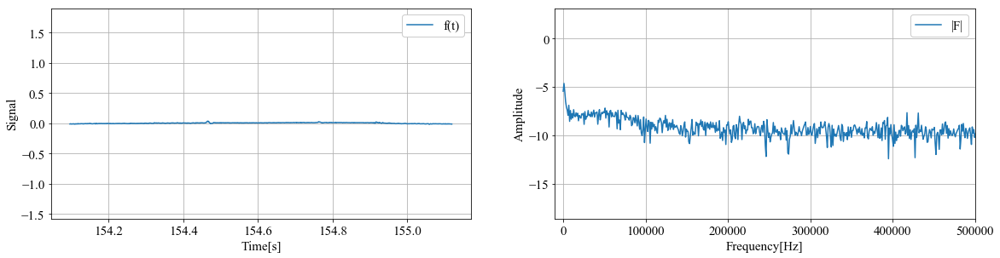

...

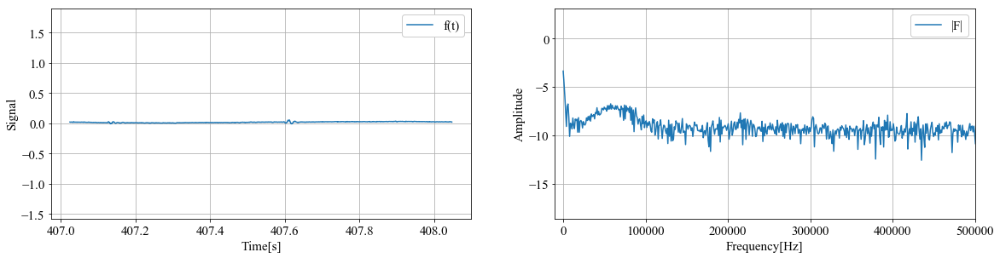

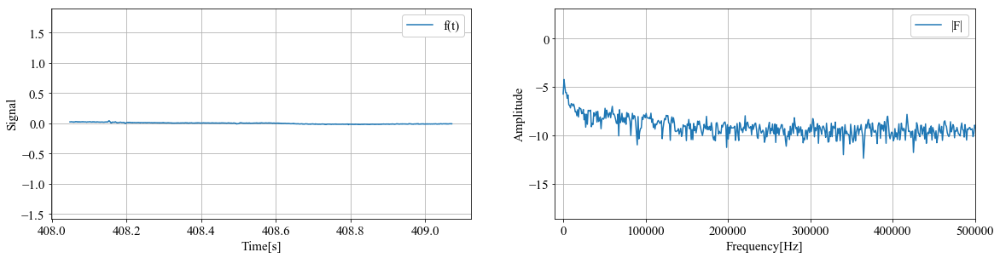

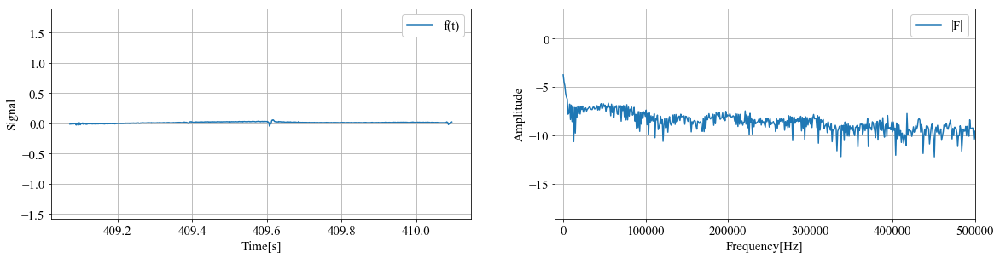

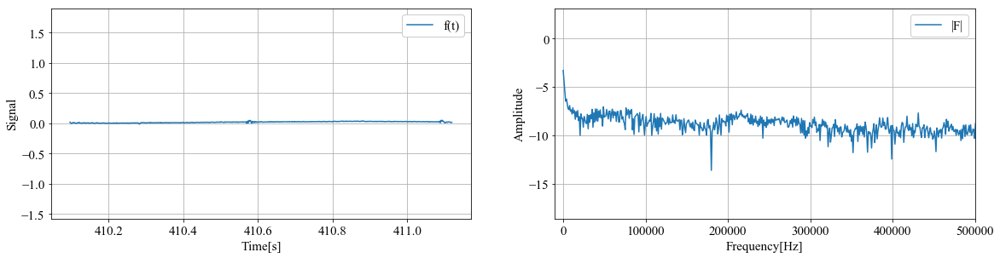

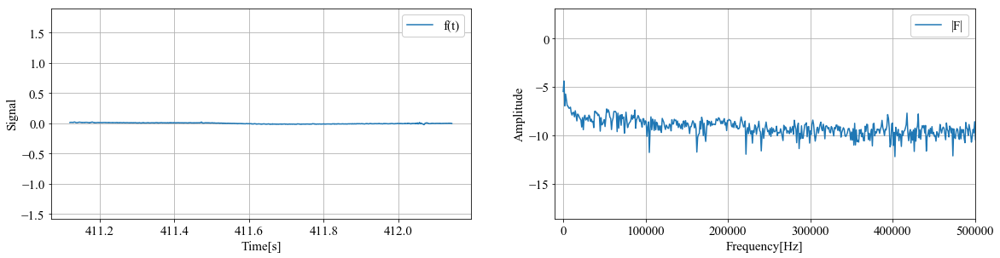

In [68]:
for j in range(0, int((2**18)/N)):
    test_fft(data_div[j].signal, data_div[j].time)

# スペクトログラム

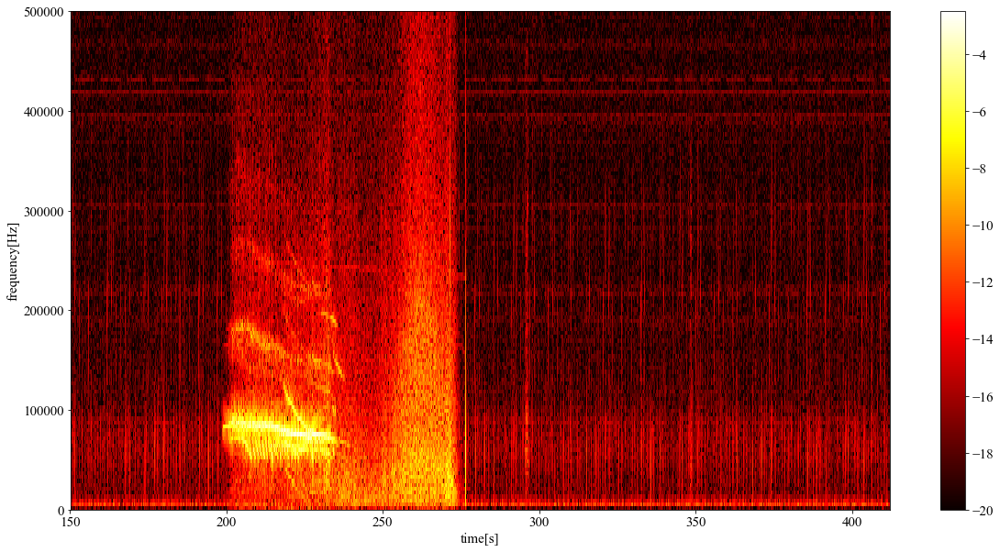

In [69]:
dt = 10**3
F, time, Sxx = signal.spectrogram(data.signal, dt)
#3d画像
plt.figure(figsize=(20,10))
plt.xlabel('time[s]')
plt.ylabel('frequency[Hz]')
#plt.axis([0, time.max(), 0, dt/2])
plt.pcolormesh(time+150, 1000*F, np.log(2*Sxx),vmax=-2.5, vmin=-20, cmap='hot')
plt.colorbar()
plt.savefig('C:/Users/Satake Kaho/Desktop/pre/result/68875/spectrogram.png')  

## フィルタリング(使うなら)

In [58]:
def spectrogram(fil):
    number = 2**18
    dt = 10.00**6 
    freq = np.linspace(0, dt, int(number))

    #フィルタリング
    F2 = np.fft.fft(data.signal)
    #fil = 1000
    F2[(freq < float(fil))] = 0
    # 周波数でフィルタリング（ノイズ除去）-> IFFT
    f2_ifft = np.fft.ifft(F2) # IFFT
    f2 = f2_ifft.real                                       
    
    # グラフ表示：オリジナルとフィルタリング（ノイズ除去）
    plt.figure(figsize=(30,10))
    plt.plot(data.time, data.signal, label='original')
    plt.plot(data.time, f2, c="r",alpha=0.2, label='filtered')
    plt.legend(loc='best')
    plt.xlabel('time(msec)', fontsize=14)
    plt.ylabel('singnal', fontsize=14)
    plt.savefig('C:/Users/Satake Kaho/Desktop/pre/result/68875/filter_%d.png'%fil) 

In [ ]:
filt = [0, 100, 500,1000, 5000, 10000, 50000]
for l in range(0, len(filt)):
    spectrogram(filt[l])

In [ ]:
fs = 10e3 #10000
N = 1e5
amp = 2 * np.sqrt(2)
noise_power = 0.001 * fs / 2
time = np.arange(N) / fs #100000
freq = np.linspace(1e3, 2e3, N)
x = amp * np.sin(2*np.pi*freq*time)
x += np.random.normal(scale=np.sqrt(noise_power), size=time.shape) #100000
f, t, Sxx = signal.spectrogram(x, fs)#t=446, f=129, Sxx=129

In [ ]:
len(Sxx)

In [ ]:
np.log(Sxx)

In [ ]:
Sxx

## To do   

set terminal png を入れるべき
できれば   
* 怪しいところを拡大   
* フィルタとかもやってみる

## わかったこと   
・200ms, ~10000Hzにあきらかなモードを発見
・time